In [9]:
# standard imports
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import datetime as dt
import yfinance as yf
import matplotlib.pyplot as plt
!pip install pyfolio
import pyfolio as pf


from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

pd.set_option('display.max_rows', None)

  Created wheel for pyfolio: filename=pyfolio-0.9.2-py3-none-any.whl size=88684 sha256=0362be0e512d2f1fe0c363568386b5842399b0829af7cb6031f3a2463121fa07
  Stored in directory: c:\users\ravi\appdata\local\pip\cache\wheels\42\16\92\9c9d49efccc497040268960f0825101cc9b1c6e41cdc5a409e
  Created wheel for empyrical: filename=empyrical-0.5.5-py3-none-any.whl size=39778 sha256=e46bef6cc0261b37567a46c529d5c110a15c7fcec902088c49d31f41ad645c5b
  Stored in directory: c:\users\ravi\appdata\local\pip\cache\wheels\0d\68\bb\926065fb744e7d7cb67334cb1a9c696722abc8303e5dc9a8d0
Successfully built pyfolio empyrical


In [10]:
# standard finance DataFrame multiple assets
# Can directly fetch the returns from Yahoo using the following

start = dt.datetime(2017,5,29).date()
end = dt.datetime(2020,6,29).date()

tickers=['TCS.NS', 'INFY.NS', 'WIPRO.NS']

DF =pd.DataFrame()
bad_tickers =[]

for i in tickers:
    try:
        print(i)
         # USE dropna() on the raw price data before calculating returns using pct_change
         # Use Adjusted prices only
        df = yf.download(i,start,end)[['Adj Close']].dropna().pct_change()
        df.columns = [i]                         
        DF = pd.concat([DF,df],axis =1)
    except:
        bad_tickers.append(i)
        

df_raw = DF.copy().round(5)


TCS.NS
[*********************100%***********************]  1 of 1 completed
INFY.NS
[*********************100%***********************]  1 of 1 completed
WIPRO.NS
[*********************100%***********************]  1 of 1 completed


In [11]:
df_raw.head()

,TCS.NS,INFY.NS,WIPRO.NS
Date,,,
2017-05-29,NaN,NaN,NaN
2017-05-30,-0.00845,0.01122,0.00290
2017-05-31,-0.00176,-0.01922,-0.00121
2017-06-01,0.00275,0.00946,0.01055
2017-06-02,0.00442,-0.00201,0.01940


In [12]:
bad_tickers

[]

In [13]:
tickers

['TCS.NS', 'INFY.NS', 'WIPRO.NS']

In [14]:
num_runs = 10000 # number of rows/iterations
result = np.zeros((num_runs,(len(tickers)+3)))
result

array([[0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       ...,
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.]])

In [15]:
result.shape
result.ndim

(10000, 6)

2

In [16]:
df = df_raw.copy()

for i in range(num_runs):
    
    # randomized weights
    weights = np.array(np.random.random(len(tickers))) 
    #Rebalance w/ constraints (SUM of all weights CANNOT BE > 1)
    weights = weights/np.sum(weights)
    
    ### daily return of the portfolio based on a given set of weights
    df['portfolio_ret'] = df.iloc[:,0]*weights[0]+df.iloc[:,1]*weights[1]+df.iloc[:,2]*weights[2]
  
                       
    # Calculating mean
    E = df['portfolio_ret'].mean()
    
    
    # Annualizing mean
    E = E*252
    

    
    # Calculating Drawdown
    def max_drawdown(return_series):
        comp_ret = (return_series+1).cumprod()
        peak = comp_ret.expanding(min_periods=1).max()
        dd = 1 - (comp_ret/peak)
        return dd.max()

    max_drawdown = max_drawdown(df['portfolio_ret'])
   
    #Calculating Annualised Calmar
    Calmar = E / max_drawdown
    
                   
    # Populating the 'result' array with the required values: Mean, Drawdown, Calmar followed by the weights                   
    result[i,0] = E
    result[i,1] = max_drawdown
    result[i,2] = Calmar
    
    for j in range(len(tickers)):
        result[i,j+3]= weights[j]

In [17]:
# Converting 'result' into a DataFrame

columns = ['Mean','Drawdown', 'Calmar'] + tickers

result = pd.DataFrame(result,columns=columns)
result

,Mean,Drawdown,Calmar,TCS.NS,INFY.NS,WIPRO.NS
0,0.143339,0.365508,0.392164,0.325729,0.120011,0.554260
1,0.180506,0.314182,0.574526,0.224784,0.485014,0.290202
2,0.171056,0.325045,0.526254,0.368080,0.267605,0.364316
3,0.096440,0.427764,0.225450,0.039076,0.098009,0.862915
4,0.210880,0.290134,0.726836,0.492466,0.412365,0.095169
5,0.143607,0.361599,0.397144,0.015761,0.450220,0.534019
6,0.139367,0.369591,0.377084,0.243893,0.179119,0.576988
7,0.178280,0.341154,0.522579,0.015446,0.691310,0.293244
8,0.170624,0.324029,0.526569,0.197503,0.445294,0.357203
9,0.128490,0.386559,0.332393,0.272179,0.073627,0.654194


In [18]:
Max_Calmar = result.iloc[result['Calmar'].idxmax()]
Max_Calmar

Min_Drawdown = result.iloc[result['Drawdown'].idxmin()]
Min_Drawdown

Mean        0.226770
Drawdown    0.265579
Calmar      0.853870
TCS.NS      0.870637
INFY.NS     0.122107
WIPRO.NS    0.007256
Name: 6509, dtype: float64

Mean        0.226770
Drawdown    0.265579
Calmar      0.853870
TCS.NS      0.870637
INFY.NS     0.122107
WIPRO.NS    0.007256
Name: 6509, dtype: float64

In [19]:
result.iloc[4290]

Mean        0.154965
Drawdown    0.346148
Calmar      0.447684
TCS.NS      0.139338
INFY.NS     0.398182
WIPRO.NS    0.462480
Name: 4290, dtype: float64

<Figure size 864x576 with 0 Axes>

Text(0.5, 0, ' Drawdown')

Text(0, 0.5, 'Return')

Text(0.5, 1.0, 'Omni Efficient Frontier')

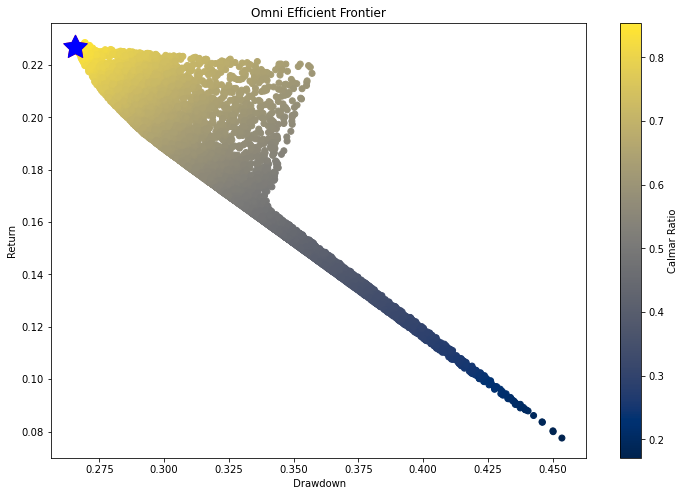

In [20]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(12,8))
plt.scatter(x=result['Drawdown'],y=result['Mean'],c=result['Calmar'],cmap='cividis')
plt.colorbar(label='Calmar Ratio')
plt.xlabel(' Drawdown')
plt.ylabel('Return')

plt.title('Omni Efficient Frontier')
#Plot a red star to highlight position of the portfolio with highest Sortino Ratio
plt.scatter(Max_Calmar[1],Max_Calmar[0],marker=(5,1,0),color='r',s=600)

#Plot a blue star to highlight position of the portfolio with minimum Variance
plt.scatter(Min_Drawdown[1],Min_Drawdown[0],marker=(5,1,0),color='b',s=600)
plt.show()

In [21]:
# standard imports
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import datetime as dt
import yfinance as yf
import matplotlib.pyplot as plt
import pyfolio as pf


from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

pd.set_option('display.max_rows', None)

In [22]:
# standard finance DataFrame multiple assets
# Can directly fetch the returns from Yahoo using the following

start = dt.datetime(2017,5,29).date()
end = dt.datetime(2020,6,29).date()

tickers=['MARUTI.NS', 'HEROMOTOCO.NS', 'M&M.NS']

DF =pd.DataFrame()
bad_tickers =[]

for i in tickers:
    try:
        print(i)
         # USE dropna() on the raw price data before calculating returns using pct_change
         # Use Adjusted prices only
        df = yf.download(i,start,end)[['Adj Close']].dropna().pct_change()
        df.columns = [i]                         
        DF = pd.concat([DF,df],axis =1)
    except:
        bad_tickers.append(i)
        

df_raw = DF.copy().round(5)


MARUTI.NS
[*********************100%***********************]  1 of 1 completed
HEROMOTOCO.NS
[*********************100%***********************]  1 of 1 completed
M&M.NS
[*********************100%***********************]  1 of 1 completed


In [23]:
df_raw.head()

,MARUTI.NS,HEROMOTOCO.NS,M&M.NS
Date,,,
2017-05-29,NaN,NaN,NaN
2017-05-30,0.00183,0.02034,0.00077
2017-05-31,0.00888,0.00136,0.04103
2017-06-01,-0.00893,-0.00323,0.00586
2017-06-02,-0.00446,0.03118,-0.00474


In [24]:
bad_tickers

[]

In [25]:
tickers

['MARUTI.NS', 'HEROMOTOCO.NS', 'M&M.NS']

In [26]:
num_runs = 10000 # number of rows/iterations
result = np.zeros((num_runs,(len(tickers)+3)))
result

array([[0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       ...,
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.]])

In [27]:
result.shape
result.ndim

(10000, 6)

2

In [28]:
df = df_raw.copy()

for i in range(num_runs):
    
    # randomized weights
    weights = np.array(np.random.random(len(tickers))) 
    #Rebalance w/ constraints (SUM of all weights CANNOT BE > 1)
    weights = weights/np.sum(weights)
    
    ### daily return of the portfolio based on a given set of weights
    df['portfolio_ret'] = df.iloc[:,0]*weights[0]+df.iloc[:,1]*weights[1]+df.iloc[:,2]*weights[2]
  
                       
    # Calculating mean
    E = df['portfolio_ret'].mean()
    
    
    # Annualizing mean
    E = E*252
    

    
    # Calculating Drawdown
    def max_drawdown(return_series):
        comp_ret = (return_series+1).cumprod()
        peak = comp_ret.expanding(min_periods=1).max()
        dd = 1 - (comp_ret/peak)
        return dd.max()

    max_drawdown = max_drawdown(df['portfolio_ret'])
   
    #Calculating Annualised Calmar
    Calmar = E / max_drawdown
    
                   
    # Populating the 'result' array with the required values: Mean, Drawdown, Calmar followed by the weights                   
    result[i,0] = E
    result[i,1] = max_drawdown
    result[i,2] = Calmar
    
    for j in range(len(tickers)):
        result[i,j+3]= weights[j]

In [29]:
# Converting 'result' into a DataFrame

columns = ['Mean','Drawdown', 'Calmar'] + tickers

result = pd.DataFrame(result,columns=columns)
result

,Mean,Drawdown,Calmar,MARUTI.NS,HEROMOTOCO.NS,M&M.NS
0,-0.021339,0.589955,-0.036170,0.311246,0.321127,0.367627
1,-0.015234,0.627585,-0.024273,0.537179,0.020103,0.442718
2,-0.009043,0.563060,-0.016061,0.701905,0.189076,0.109020
3,-0.019989,0.559509,-0.035726,0.332695,0.464614,0.202690
4,-0.013657,0.612173,-0.022309,0.579720,0.058893,0.361387
5,-0.030141,0.612157,-0.049237,0.021636,0.488974,0.489390
6,-0.021022,0.604116,-0.034798,0.330543,0.249717,0.419741
7,-0.021770,0.581880,-0.037414,0.290555,0.377188,0.332257
8,-0.023648,0.603737,-0.039169,0.242562,0.311391,0.446047
9,-0.020086,0.553693,-0.036276,0.324685,0.501959,0.173356


In [30]:
Max_Calmar = result.iloc[result['Calmar'].idxmax()]
Max_Calmar

Min_Drawdown = result.iloc[result['Drawdown'].idxmin()]
Min_Drawdown

Mean            -0.001738
Drawdown         0.580747
Calmar          -0.002992
MARUTI.NS        0.947339
HEROMOTOCO.NS    0.012535
M&M.NS           0.040125
Name: 3066, dtype: float64

Mean            -0.022196
Drawdown         0.537126
Calmar          -0.041323
MARUTI.NS        0.224054
HEROMOTOCO.NS    0.772161
M&M.NS           0.003785
Name: 7592, dtype: float64

In [31]:
result.iloc[1521]

Mean            -0.017935
Drawdown         0.619044
Calmar          -0.028972
MARUTI.NS        0.442429
HEROMOTOCO.NS    0.114865
M&M.NS           0.442706
Name: 1521, dtype: float64

<Figure size 864x576 with 0 Axes>

Text(0.5, 0, ' Drawdown')

Text(0, 0.5, 'Return')

Text(0.5, 1.0, 'Omni Efficient Frontier')

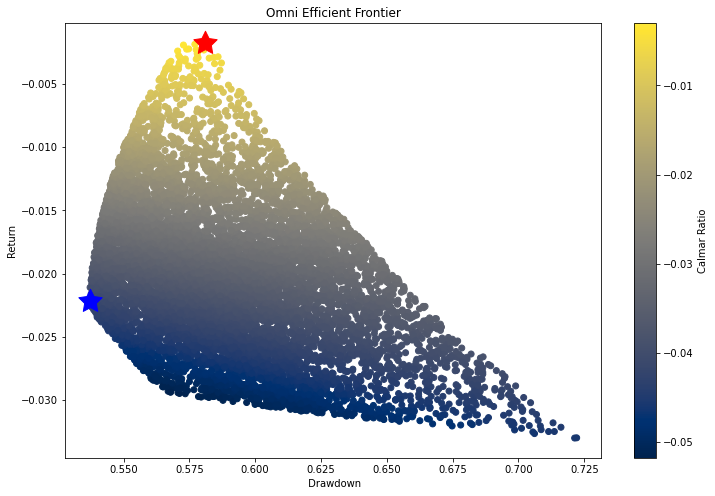

In [32]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(12,8))
plt.scatter(x=result['Drawdown'],y=result['Mean'],c=result['Calmar'],cmap='cividis')
plt.colorbar(label='Calmar Ratio')
plt.xlabel(' Drawdown')
plt.ylabel('Return')

plt.title('Omni Efficient Frontier')
#Plot a red star to highlight position of the portfolio with highest Sortino Ratio
plt.scatter(Max_Calmar[1],Max_Calmar[0],marker=(5,1,0),color='r',s=600)

#Plot a blue star to highlight position of the portfolio with minimum Variance
plt.scatter(Min_Drawdown[1],Min_Drawdown[0],marker=(5,1,0),color='b',s=600)
plt.show()

In [41]:
# standard imports
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import datetime as dt
import yfinance as yf
import matplotlib.pyplot as plt
import pyfolio as pf


from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

pd.set_option('display.max_rows', None)

In [42]:
# standard finance DataFrame multiple assets
# Can directly fetch the returns from Yahoo using the following

start = dt.datetime(2017,5,29).date()
end = dt.datetime(2020,6,29).date()

tickers=['HDFCBANK.NS', 'KOTAKBANK.NS', 'ICICIBANK.NS']

DF =pd.DataFrame()
bad_tickers =[]

for i in tickers:
    try:
        print(i)
         # USE dropna() on the raw price data before calculating returns using pct_change
         # Use Adjusted prices only
        df = yf.download(i,start,end)[['Adj Close']].dropna().pct_change()
        df.columns = [i]                         
        DF = pd.concat([DF,df],axis =1)
    except:
        bad_tickers.append(i)
        

df_raw = DF.copy().round(5)


HDFCBANK.NS
[*********************100%***********************]  1 of 1 completed
KOTAKBANK.NS
[*********************100%***********************]  1 of 1 completed
ICICIBANK.NS
[*********************100%***********************]  1 of 1 completed


In [43]:
df_raw.head()

,HDFCBANK.NS,KOTAKBANK.NS,ICICIBANK.NS
Date,,,
2017-05-29,NaN,NaN,NaN
2017-05-30,-0.00175,-0.00681,0.02064
2017-05-31,0.00439,0.00426,0.01571
2017-06-01,-0.00464,-0.00352,-0.01945
2017-06-02,0.00347,0.00270,-0.00609


In [44]:
bad_tickers

[]

In [45]:
tickers

['HDFCBANK.NS', 'KOTAKBANK.NS', 'ICICIBANK.NS']

In [46]:
num_runs = 10000 # number of rows/iterations
result = np.zeros((num_runs,(len(tickers)+3)))
result

array([[0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       ...,
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.]])

In [47]:
result.shape
result.ndim

(10000, 6)

2

In [48]:
df = df_raw.copy()

for i in range(num_runs):
    
    # randomized weights
    weights = np.array(np.random.random(len(tickers))) 
    #Rebalance w/ constraints (SUM of all weights CANNOT BE > 1)
    weights = weights/np.sum(weights)
    
    ### daily return of the portfolio based on a given set of weights
    df['portfolio_ret'] = df.iloc[:,0]*weights[0]+df.iloc[:,1]*weights[1]+df.iloc[:,2]*weights[2]
  
                       
    # Calculating mean
    E = df['portfolio_ret'].mean()
    
    
    # Annualizing mean
    E = E*252
    

    
    # Calculating Drawdown
    def max_drawdown(return_series):
        comp_ret = (return_series+1).cumprod()
        peak = comp_ret.expanding(min_periods=1).max()
        dd = 1 - (comp_ret/peak)
        return dd.max()

    max_drawdown = max_drawdown(df['portfolio_ret'])
   
    #Calculating Annualised Calmar
    Calmar = E / max_drawdown
    
                   
    # Populating the 'result' array with the required values: Mean, Drawdown, Calmar followed by the weights                   
    result[i,0] = E
    result[i,1] = max_drawdown
    result[i,2] = Calmar
    
    for j in range(len(tickers)):
        result[i,j+3]= weights[j]

In [49]:
# Converting 'result' into a DataFrame

columns = ['Mean','Drawdown', 'Calmar'] + tickers

result = pd.DataFrame(result,columns=columns)
result

,Mean,Drawdown,Calmar,HDFCBANK.NS,KOTAKBANK.NS,ICICIBANK.NS
0,0.146501,0.393216,0.372573,0.296416,0.534146,0.169438
1,0.140805,0.442755,0.318020,0.425139,0.034117,0.540743
2,0.151399,0.437932,0.345714,0.040914,0.339794,0.619293
3,0.144477,0.429247,0.336582,0.308219,0.210053,0.481729
4,0.143455,0.413814,0.346665,0.372564,0.298192,0.329243
5,0.147670,0.399322,0.369801,0.241742,0.514848,0.243409
6,0.150104,0.436400,0.343960,0.089963,0.311373,0.598664
7,0.134777,0.412542,0.326699,0.703872,0.119255,0.176873
8,0.152063,0.413914,0.367379,0.054854,0.522882,0.422264
9,0.150295,0.424084,0.354399,0.102557,0.400972,0.496471


In [50]:
Max_Calmar = result.iloc[result['Calmar'].idxmax()]
Max_Calmar

Min_Drawdown = result.iloc[result['Drawdown'].idxmin()]
Min_Drawdown

Mean            0.155766
Drawdown        0.367066
Calmar          0.424354
HDFCBANK.NS     0.001704
KOTAKBANK.NS    0.979427
ICICIBANK.NS    0.018869
Name: 409, dtype: float64

Mean            0.155153
Drawdown        0.366251
Calmar          0.423626
HDFCBANK.NS     0.025906
KOTAKBANK.NS    0.970320
ICICIBANK.NS    0.003774
Name: 8257, dtype: float64

In [51]:
result.iloc[409]

Mean            0.155766
Drawdown        0.367066
Calmar          0.424354
HDFCBANK.NS     0.001704
KOTAKBANK.NS    0.979427
ICICIBANK.NS    0.018869
Name: 409, dtype: float64

<Figure size 864x576 with 0 Axes>

Text(0.5, 0, ' Drawdown')

Text(0, 0.5, 'Return')

Text(0.5, 1.0, 'Omni Efficient Frontier')

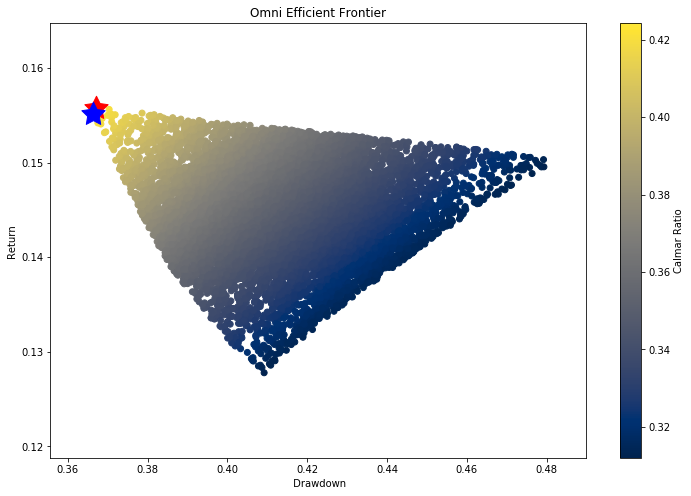

In [52]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(12,8))
plt.scatter(x=result['Drawdown'],y=result['Mean'],c=result['Calmar'],cmap='cividis')
plt.colorbar(label='Calmar Ratio')
plt.xlabel(' Drawdown')
plt.ylabel('Return')

plt.title('Omni Efficient Frontier')
#Plot a red star to highlight position of the portfolio with highest Sortino Ratio
plt.scatter(Max_Calmar[1],Max_Calmar[0],marker=(5,1,0),color='r',s=600)

#Plot a blue star to highlight position of the portfolio with minimum Variance
plt.scatter(Min_Drawdown[1],Min_Drawdown[0],marker=(5,1,0),color='b',s=600)
plt.show()

In [53]:
# standard imports
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import datetime as dt
import yfinance as yf
import matplotlib.pyplot as plt
import pyfolio as pf


from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

pd.set_option('display.max_rows', None)


In [54]:
# standard finance DataFrame multiple assets
# Can directly fetch the returns from Yahoo using the following

start = dt.datetime(2017,5,29).date()
end = dt.datetime(2020,6,29).date()

tickers=['BAJAJFINSV.NS', 'BAJFINANCE.NS', 'MUTHOOTFIN.NS']

DF =pd.DataFrame()
bad_tickers =[]

for i in tickers:
    try:
        print(i)
         # USE dropna() on the raw price data before calculating returns using pct_change
         # Use Adjusted prices only
        df = yf.download(i,start,end)[['Adj Close']].dropna().pct_change()
        df.columns = [i]                         
        DF = pd.concat([DF,df],axis =1)
    except:
        bad_tickers.append(i)
        

df_raw = DF.copy().round(5)


BAJAJFINSV.NS
[*********************100%***********************]  1 of 1 completed
BAJFINANCE.NS
[*********************100%***********************]  1 of 1 completed
MUTHOOTFIN.NS
[*********************100%***********************]  1 of 1 completed


In [55]:
df_raw.head()

,BAJAJFINSV.NS,BAJFINANCE.NS,MUTHOOTFIN.NS
Date,,,
2017-05-29,NaN,NaN,NaN
2017-05-30,0.03913,0.01078,0.01036
2017-05-31,0.00903,0.00409,0.04455
2017-06-01,0.00324,0.00030,-0.00654
2017-06-02,0.02383,0.02554,0.04452


In [56]:
bad_tickers

[]

In [57]:
tickers

['BAJAJFINSV.NS', 'BAJFINANCE.NS', 'MUTHOOTFIN.NS']

In [58]:
num_runs = 10000 # number of rows/iterations
result = np.zeros((num_runs,(len(tickers)+3)))
result

array([[0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       ...,
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.]])

In [59]:
result.shape
result.ndim

(10000, 6)

2

In [60]:
df = df_raw.copy()

for i in range(num_runs):
    
    # randomized weights
    weights = np.array(np.random.random(len(tickers))) 
    #Rebalance w/ constraints (SUM of all weights CANNOT BE > 1)
    weights = weights/np.sum(weights)
    
    ### daily return of the portfolio based on a given set of weights
    df['portfolio_ret'] = df.iloc[:,0]*weights[0]+df.iloc[:,1]*weights[1]+df.iloc[:,2]*weights[2]
  
                       
    # Calculating mean
    E = df['portfolio_ret'].mean()
   
    
    # Annualizing mean
    E = E*252
    

    
    # Calculating Drawdown
    def max_drawdown(return_series):
        comp_ret = (return_series+1).cumprod()
        peak = comp_ret.expanding(min_periods=1).max()
        dd = 1 - (comp_ret/peak)
        return dd.max()

    max_drawdown = max_drawdown(df['portfolio_ret'])
   
    #Calculating Annualised Calmar
    Calmar = E / max_drawdown
    
                   
    # Populating the 'result' array with the required values: Mean, Drawdown, Calmar followed by the weights                   
    result[i,0] = E
    result[i,1] = max_drawdown
    result[i,2] = Calmar
    
    for j in range(len(tickers)):
        result[i,j+3]= weights[j]

In [61]:
# Converting 'result' into a DataFrame

columns = ['Mean','Drawdown', 'Calmar'] + tickers

result = pd.DataFrame(result,columns=columns)
result

,Mean,Drawdown,Calmar,BAJAJFINSV.NS,BAJFINANCE.NS,MUTHOOTFIN.NS
0,0.345796,0.482934,0.716031,0.412171,0.098798,0.489031
1,0.332494,0.599978,0.554177,0.231038,0.735430,0.033532
2,0.329455,0.563557,0.584599,0.300168,0.581612,0.118220
3,0.368183,0.497564,0.739970,0.189656,0.455435,0.354909
4,0.371808,0.495634,0.750167,0.181241,0.438399,0.380360
5,0.359117,0.576285,0.623159,0.106278,0.780811,0.112911
6,0.380614,0.472658,0.805264,0.277720,0.080393,0.641887
7,0.343899,0.559023,0.615178,0.220176,0.639559,0.140265
8,0.283946,0.572202,0.496234,0.560670,0.376105,0.063225
9,0.335053,0.515128,0.650427,0.329619,0.440359,0.230022


In [62]:
Max_Calmar = result.iloc[result['Calmar'].idxmax()]
Max_Calmar

Min_Drawdown = result.iloc[result['Drawdown'].idxmin()]
Min_Drawdown

Mean             0.452426
Drawdown         0.449709
Calmar           1.006041
BAJAJFINSV.NS    0.014882
BAJFINANCE.NS    0.003283
MUTHOOTFIN.NS    0.981836
Name: 4793, dtype: float64

Mean             0.452426
Drawdown         0.449709
Calmar           1.006041
BAJAJFINSV.NS    0.014882
BAJFINANCE.NS    0.003283
MUTHOOTFIN.NS    0.981836
Name: 4793, dtype: float64

In [63]:
result.iloc[4793]

Mean             0.452426
Drawdown         0.449709
Calmar           1.006041
BAJAJFINSV.NS    0.014882
BAJFINANCE.NS    0.003283
MUTHOOTFIN.NS    0.981836
Name: 4793, dtype: float64

<Figure size 864x576 with 0 Axes>

Text(0.5, 0, ' Drawdown')

Text(0, 0.5, 'Return')

Text(0.5, 1.0, 'Omni Efficient Frontier')

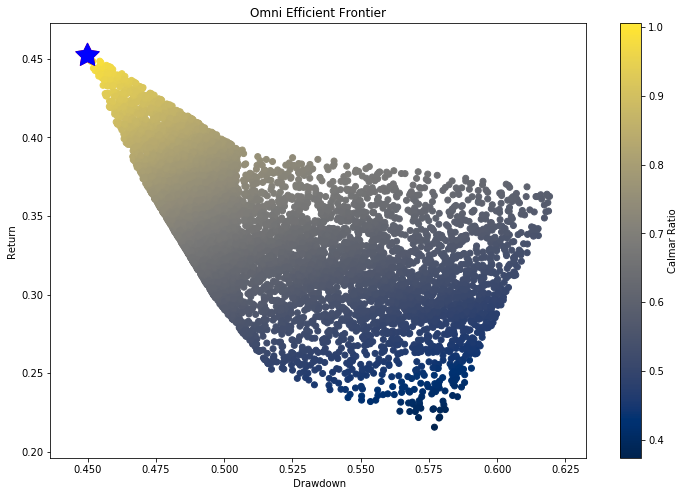

In [64]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(12,8))
plt.scatter(x=result['Drawdown'],y=result['Mean'],c=result['Calmar'],cmap='cividis')
plt.colorbar(label='Calmar Ratio')
plt.xlabel(' Drawdown')
plt.ylabel('Return')

plt.title('Omni Efficient Frontier')
#Plot a red star to highlight position of the portfolio with highest Sortino Ratio
plt.scatter(Max_Calmar[1],Max_Calmar[0],marker=(5,1,0),color='r',s=600)

#Plot a blue star to highlight position of the portfolio with minimum Variance
plt.scatter(Min_Drawdown[1],Min_Drawdown[0],marker=(5,1,0),color='b',s=600)
plt.show()

In [65]:
# standard imports
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import datetime as dt
import yfinance as yf
import matplotlib.pyplot as plt
import pyfolio as pf


from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

pd.set_option('display.max_rows', None)

In [67]:
# standard finance DataFrame multiple assets
# Can directly fetch the returns from Yahoo using the following

start = dt.datetime(2017,5,29).date()
end = dt.datetime(2020,6,29).date()

tickers=['PFIZER.NS', 'ASTRAZEN.NS', 'GLAXO.NS']

DF =pd.DataFrame()
bad_tickers =[]

for i in tickers:
    try:
        print(i)
         # USE dropna() on the raw price data before calculating returns using pct_change
         # Use Adjusted prices only
        df = yf.download(i,start,end)[['Adj Close']].dropna().pct_change()
        df.columns = [i]                         
        DF = pd.concat([DF,df],axis =1)
    except:
        bad_tickers.append(i)
        

df_raw = DF.copy().round(5)


PFIZER.NS
[*********************100%***********************]  1 of 1 completed
ASTRAZEN.NS
[*********************100%***********************]  1 of 1 completed
GLAXO.NS
[*********************100%***********************]  1 of 1 completed


In [68]:
df_raw.head()

,PFIZER.NS,ASTRAZEN.NS,GLAXO.NS
Date,,,
2017-05-29,NaN,NaN,NaN
2017-05-30,-0.00302,-0.00200,0.02555
2017-05-31,0.01114,0.00584,0.01678
2017-06-01,0.03079,0.00710,0.01365
2017-06-02,-0.01712,-0.00118,0.00164


In [69]:
bad_tickers

[]

In [70]:
tickers

['PFIZER.NS', 'ASTRAZEN.NS', 'GLAXO.NS']

In [71]:
num_runs = 10000 # number of rows/iterations
result = np.zeros((num_runs,(len(tickers)+3)))
result

array([[0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       ...,
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.]])

In [72]:
result.shape
result.ndim

(10000, 6)

2

In [73]:
df = df_raw.copy()

for i in range(num_runs):
    
    # randomized weights
    weights = np.array(np.random.random(len(tickers))) 
    #Rebalance w/ constraints (SUM of all weights CANNOT BE > 1)
    weights = weights/np.sum(weights)
    
    ### daily return of the portfolio based on a given set of weights
    df['portfolio_ret'] = df.iloc[:,0]*weights[0]+df.iloc[:,1]*weights[1]+df.iloc[:,2]*weights[2]
  
                       
    # Calculating mean
    E = df['portfolio_ret'].mean()
    
    
    # Annualizing mean
    E = E*252
    

    
    # Calculating Drawdown
    def max_drawdown(return_series):
        comp_ret = (return_series+1).cumprod()
        peak = comp_ret.expanding(min_periods=1).max()
        dd = 1 - (comp_ret/peak)
        return dd.max()

    max_drawdown = max_drawdown(df['portfolio_ret'])
   
    #Calculating Annualised Calmar
    Calmar = E / max_drawdown
    
                   
    # Populating the 'result' array with the required values: Mean, Drawdown, Calmar followed by the weights                   
    result[i,0] = E
    result[i,1] = max_drawdown
    result[i,2] = Calmar
    
    for j in range(len(tickers)):
        result[i,j+3]= weights[j]

In [74]:
# Converting 'result' into a DataFrame

columns = ['Mean','Drawdown', 'Calmar'] + tickers

result = pd.DataFrame(result,columns=columns)
result

,Mean,Drawdown,Calmar,PFIZER.NS,ASTRAZEN.NS,GLAXO.NS
0,0.388949,0.295337,1.316966,0.203278,0.519987,0.276734
1,0.382542,0.262283,1.458508,0.394233,0.384580,0.221187
2,0.395009,0.258447,1.528395,0.429912,0.395050,0.175038
3,0.357204,0.286272,1.247778,0.252984,0.406004,0.341012
4,0.424737,0.267183,1.589687,0.529702,0.410877,0.059421
5,0.332451,0.273720,1.214566,0.326237,0.295693,0.378070
6,0.269929,0.268734,1.004446,0.412363,0.078514,0.509123
7,0.378747,0.300190,1.261692,0.173728,0.511639,0.314633
8,0.305273,0.300275,1.016646,0.170093,0.321555,0.508352
9,0.344623,0.259972,1.325616,0.601489,0.156551,0.241960


In [75]:
Max_Calmar = result.iloc[result['Calmar'].idxmax()]
Max_Calmar

Min_Drawdown = result.iloc[result['Drawdown'].idxmin()]
Min_Drawdown

Mean           0.481101
Drawdown       0.284731
Calmar         1.689666
PFIZER.NS      0.287454
ASTRAZEN.NS    0.708928
GLAXO.NS       0.003618
Name: 1010, dtype: float64

Mean           0.350046
Drawdown       0.246267
Calmar         1.421409
PFIZER.NS      0.486899
ASTRAZEN.NS    0.241940
GLAXO.NS       0.271161
Name: 7404, dtype: float64

In [76]:
result.iloc[1010]

Mean           0.481101
Drawdown       0.284731
Calmar         1.689666
PFIZER.NS      0.287454
ASTRAZEN.NS    0.708928
GLAXO.NS       0.003618
Name: 1010, dtype: float64

<Figure size 864x576 with 0 Axes>

Text(0.5, 0, ' Drawdown')

Text(0, 0.5, 'Return')

Text(0.5, 1.0, 'Omni Efficient Frontier')

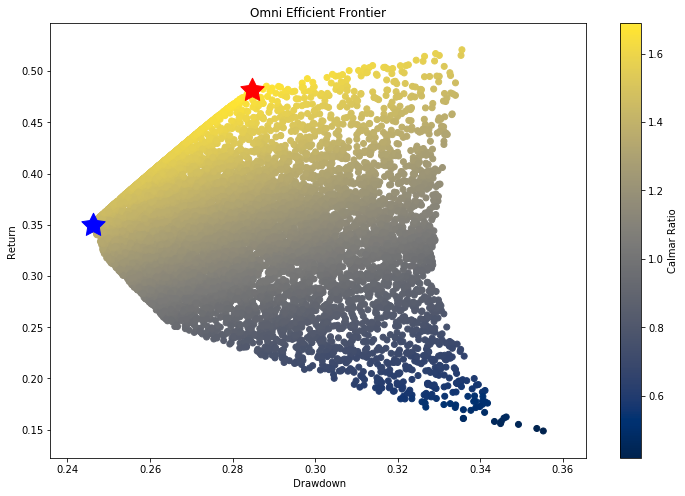

In [77]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(12,8))
plt.scatter(x=result['Drawdown'],y=result['Mean'],c=result['Calmar'],cmap='cividis')
plt.colorbar(label='Calmar Ratio')
plt.xlabel(' Drawdown')
plt.ylabel('Return')

plt.title('Omni Efficient Frontier')
#Plot a red star to highlight position of the portfolio with highest Sortino Ratio
plt.scatter(Max_Calmar[1],Max_Calmar[0],marker=(5,1,0),color='r',s=600)

#Plot a blue star to highlight position of the portfolio with minimum Variance
plt.scatter(Min_Drawdown[1],Min_Drawdown[0],marker=(5,1,0),color='b',s=600)
plt.show()